In [1]:
import numpy as np
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd

from fastai.vision import *

In [2]:
# Input root directory
input_root_dir = "../input/food-101/food-101/food-101"
input_root_path = Path(input_root_dir)
print(os.listdir(input_root_dir))

['images', 'meta', '.DS_Store', 'license_agreement.txt', 'README.txt']


In [3]:
# Image directory categories
input_image_path = input_root_path/'images'
image_categories = os.listdir(input_image_path)
image_categories.remove('.DS_Store')

print(image_categories)
print(len(image_categories))

['mussels', 'samosa', 'french_onion_soup', 'tiramisu', 'macaroni_and_cheese', 'bread_pudding', 'chicken_wings', 'greek_salad', 'shrimp_and_grits', 'croque_madame', 'prime_rib', 'clam_chowder', 'grilled_salmon', 'bibimbap', 'oysters', 'grilled_cheese_sandwich', 'french_toast', 'peking_duck', 'panna_cotta', 'pancakes', 'beet_salad', 'fish_and_chips', 'strawberry_shortcake', 'ravioli', 'bruschetta', 'churros', 'pad_thai', 'cheese_plate', 'hummus', 'pulled_pork_sandwich', 'poutine', 'sushi', 'fried_calamari', 'gyoza', 'onion_rings', 'foie_gras', 'beef_carpaccio', 'red_velvet_cake', 'caprese_salad', 'edamame', 'huevos_rancheros', 'frozen_yogurt', 'baklava', 'eggs_benedict', 'club_sandwich', 'breakfast_burrito', 'chicken_quesadilla', 'nachos', 'chocolate_cake', 'ceviche', 'pork_chop', 'cheesecake', 'hamburger', 'caesar_salad', 'garlic_bread', 'spaghetti_bolognese', 'chocolate_mousse', 'guacamole', 'lobster_bisque', 'chicken_curry', 'steak', 'waffles', 'paella', 'spaghetti_carbonara', 'cannol

In [4]:
os.listdir(input_root_path/'meta')

['labels.txt',
 'train.txt',
 'test.txt',
 'train.json',
 'test.json',
 'classes.txt']

In [5]:
# Contruct a pandas DataFrame from the given meta file, storing the filepath, category, train/validation set
def get_df_from_file(file_path, is_valid):   
    img_df = pd.read_csv(file_path, sep=';', names=['raw_txt'])
    # Append .jpg extension to all file names
    img_df['full_file_name'] = img_df['raw_txt'] + '.jpg'
    
    regex_pattern = r'(.+)\/(.+)'
    # Format of each line in input file is: category/filename, so extract accoding to this pattern
    extracted_df = img_df['full_file_name'].str.extract(regex_pattern)
    extracted_df.columns = ['category', 'file_name']

    # Join extracted values and set is_valid
    img_df = pd.DataFrame.join(img_df, extracted_df)
    img_df['is_valid'] = is_valid
    return img_df

# Load train and test file information in meta folder
train_txt_file_path = (input_root_path.joinpath('meta', 'train.txt'))
train_df = get_df_from_file(train_txt_file_path, False)
print(train_df.shape)

test_txt_file_path = (input_root_path.joinpath('meta', 'test.txt'))
test_df = get_df_from_file(test_txt_file_path, True)
print(test_df.shape)

image_df = pd.concat([train_df, test_df])
display(image_df.sample(5))
print(image_df.shape)

# 75750 entries in train and 25250 entries in test

(75750, 5)
(25250, 5)


,raw_txt,full_file_name,category,file_name,is_valid
20696,creme_brulee/2873547,creme_brulee/2873547.jpg,creme_brulee,2873547.jpg,False
60727,pulled_pork_sandwich/904084,pulled_pork_sandwich/904084.jpg,pulled_pork_sandwich,904084.jpg,False
24348,dumplings/2634555,dumplings/2634555.jpg,dumplings,2634555.jpg,False
42051,huevos_rancheros/1189521,huevos_rancheros/1189521.jpg,huevos_rancheros,1189521.jpg,False
1848,baklava/2546142,baklava/2546142.jpg,baklava,2546142.jpg,False


(101000, 5)


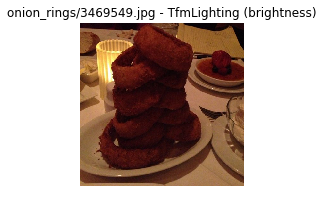

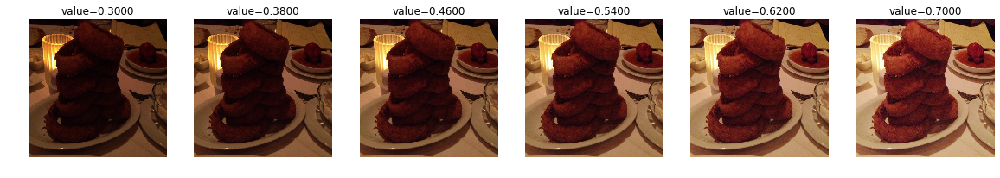

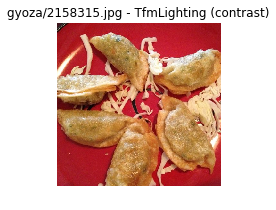

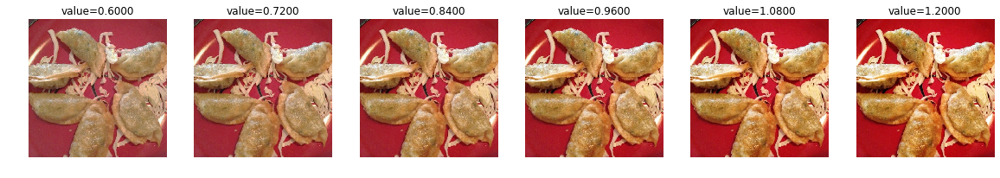

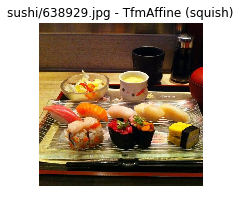

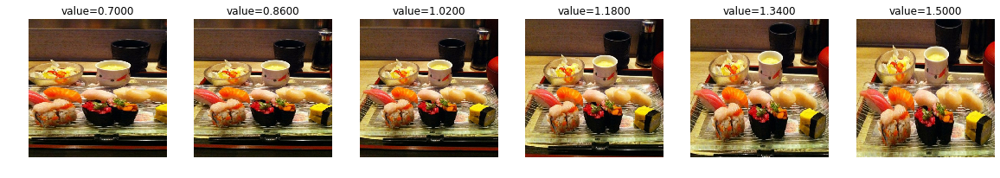

In [6]:
# Visualize transforms separately on a random image
def display_transform(img_df, transform, min_value, max_value, columns, width, height):
    sample_file_name = img_df.sample(1)['full_file_name'].iloc[0]
    img = open_image(input_image_path/sample_file_name)
    img.show(title=sample_file_name + ' - ' + str(transform))
    
    fig, axes = plt.subplots(1, columns, figsize=(width,height))
    
    for value, axis in zip(np.linspace(min_value, max_value, columns), axes):
        img = open_image(input_image_path/sample_file_name)
        transform(img, value).show(ax=axis, title=f'value={value:.4f}')
        
display_transform(image_df, brightness, 0.5 - 0.2, 0.5 + 0.2, 6, 20, 14)
display_transform(image_df, contrast, 1 - 0.4, 1 + 0.2, 6, 20, 14)
display_transform(image_df, squish,1 - 0.3, 1 + 0.5, 6, 20, 14)

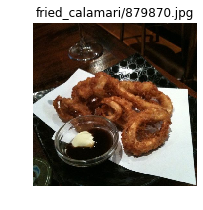

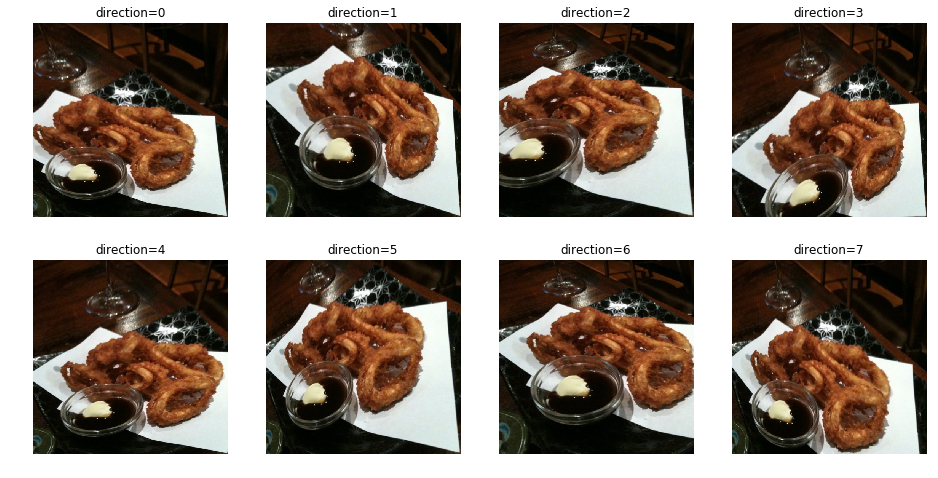

In [7]:
# Displaying skew requires a different logic than the other transforms
def display_extra_transform(img_df, rows, columns, width, height):
    sample_file_name = img_df.sample(1)['full_file_name'].iloc[0]
    img = open_image(input_image_path/sample_file_name)
    img.show(title=sample_file_name)

    fig, axs = plt.subplots(rows, columns, figsize=(width,height))
    for i, ax in enumerate(axs.flatten()):
        open_image(input_image_path/sample_file_name).skew(i, 0.7).show(ax=ax, title=f'direction={i}')

display_extra_transform(image_df, 2, 4, 16, 8)

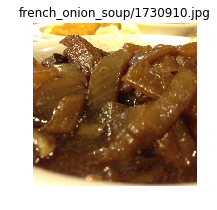

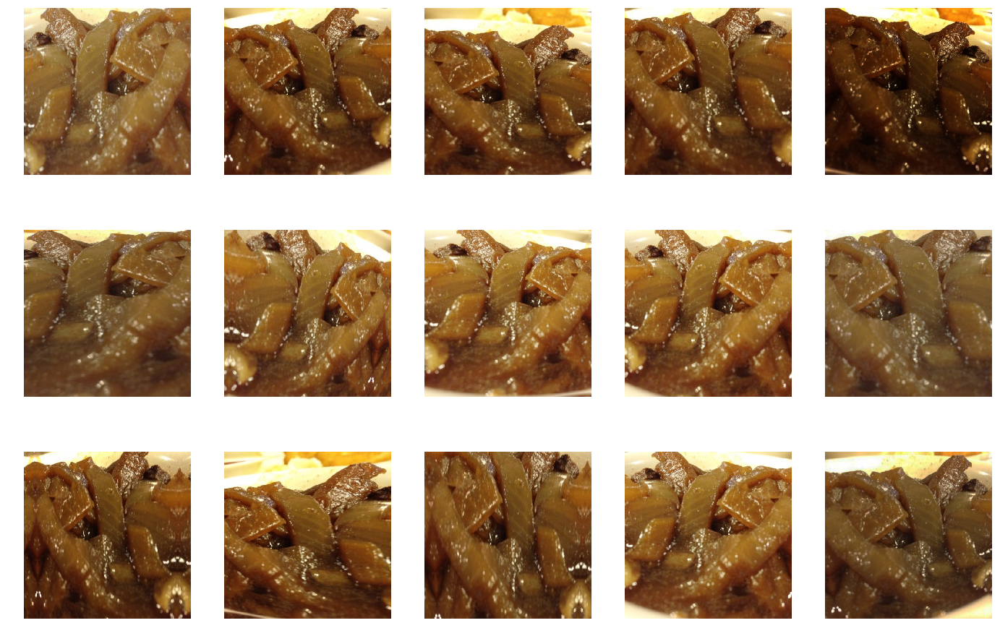

In [8]:
# Display all random transforms combined on the same random image
image_transforms = get_transforms(
    max_rotate=10,
    max_zoom=1.1,
    max_lighting=None,
    max_warp=0.2,
    xtra_tfms=[
        brightness(change=(0.5-0.2, 0.5+0.2), p=0.75),
        contrast(scale=(1-0.4, 1+0.2), p=0.75),
        squish(scale=(1-0.3, 1+0.5), p=0.75),
        skew(direction=(0, 7), magnitude=random.randint(0,6)/10, p=0.75),
    ]
)

def display_transforms(img_df, rows, columns, width, height, img_transforms):
    sample_file_name = img_df.sample(1)['full_file_name'].iloc[0]
    img = open_image(input_image_path/sample_file_name)
    img.show(title=sample_file_name)
    
    fig, axes = plt.subplots(rows, columns, figsize=(width, height))
    
    for row in range(rows):
        for axis in axes[row]:
            transformed_img = img.apply_tfms(img_transforms[0])
            transformed_img.show(ax=axis)

display_transforms(image_df, 3, 5, 24, 16, image_transforms)

In [9]:
# Define transforms used for data augmentation
# By default, only horizontal flip is used, not vertical flip
# Disable default lighting alteration, and use brightness and constrast for finer control
image_transforms = get_transforms(
    max_rotate=10,
    max_zoom=1.1,
    max_lighting=None,
    max_warp=0.2,
    xtra_tfms=[
        brightness(change=(0.5-0.2, 0.5+0.2), p=0.75),
        contrast(scale=(1-0.4, 1+0.2), p=0.75),
        squish(scale=(1-0.3, 1+0.5), p=0.75),
        skew(direction=(0, 7), magnitude=random.randint(0,6)/10, p=0.75),
    ]
)

In [10]:
# Loading image to a ImageList from path in DataFrame
split_and_labeled_images = (ImageList.from_df(
    image_df, 
    input_image_path,
    cols='full_file_name',    
))

# Split image into train and validation set based on the is_valid column
split_and_labeled_images = split_and_labeled_images.split_from_df(col='is_valid')

# Label images based on category column
split_and_labeled_images = split_and_labeled_images.label_from_df(cols='category')

print(split_and_labeled_images)

LabelLists;

Train: LabelList (75750 items)
x: ImageList
Image (3, 512, 308),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512),Image (3, 512, 512)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Valid: LabelList (25250 items)
x: ImageList
Image (3, 512, 512),Image (3, 512, 384),Image (3, 512, 384),Image (3, 512, 382),Image (3, 342, 512)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Test: None


In [11]:
image_batch_size = 64
transform_image_size = (256, 256)

# Set transform, final size and resize method
# Normalize with ImageNet stats, because the chosen model will be ResNet pre-trained with ImageNet
image_data_bunch = (
    split_and_labeled_images.transform(
        image_transforms, 
        size=transform_image_size, 
        resize_method=ResizeMethod.SQUISH)
    .databunch(bs=image_batch_size)
    .normalize(imagenet_stats)
)

# Peek inside the DataBunch
# It contains images of size 256 x 256 with 3 color channels
print(image_data_bunch)

ImageDataBunch;

Train: LabelList (75750 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Valid: LabelList (25250 items)
x: ImageList
Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256),Image (3, 256, 256)
y: CategoryList
apple_pie,apple_pie,apple_pie,apple_pie,apple_pie
Path: ../input/food-101/food-101/food-101/images;

Test: None


In [12]:
# Check the categories and their total count
print(image_data_bunch.classes)
print(len(image_data_bunch.classes))
print(image_data_bunch.c)

['apple_pie', 'baby_back_ribs', 'baklava', 'beef_carpaccio', 'beef_tartare', 'beet_salad', 'beignets', 'bibimbap', 'bread_pudding', 'breakfast_burrito', 'bruschetta', 'caesar_salad', 'cannoli', 'caprese_salad', 'carrot_cake', 'ceviche', 'cheese_plate', 'cheesecake', 'chicken_curry', 'chicken_quesadilla', 'chicken_wings', 'chocolate_cake', 'chocolate_mousse', 'churros', 'clam_chowder', 'club_sandwich', 'crab_cakes', 'creme_brulee', 'croque_madame', 'cup_cakes', 'deviled_eggs', 'donuts', 'dumplings', 'edamame', 'eggs_benedict', 'escargots', 'falafel', 'filet_mignon', 'fish_and_chips', 'foie_gras', 'french_fries', 'french_onion_soup', 'french_toast', 'fried_calamari', 'fried_rice', 'frozen_yogurt', 'garlic_bread', 'gnocchi', 'greek_salad', 'grilled_cheese_sandwich', 'grilled_salmon', 'guacamole', 'gyoza', 'hamburger', 'hot_and_sour_soup', 'hot_dog', 'huevos_rancheros', 'hummus', 'ice_cream', 'lasagna', 'lobster_bisque', 'lobster_roll_sandwich', 'macaroni_and_cheese', 'macarons', 'miso_sou

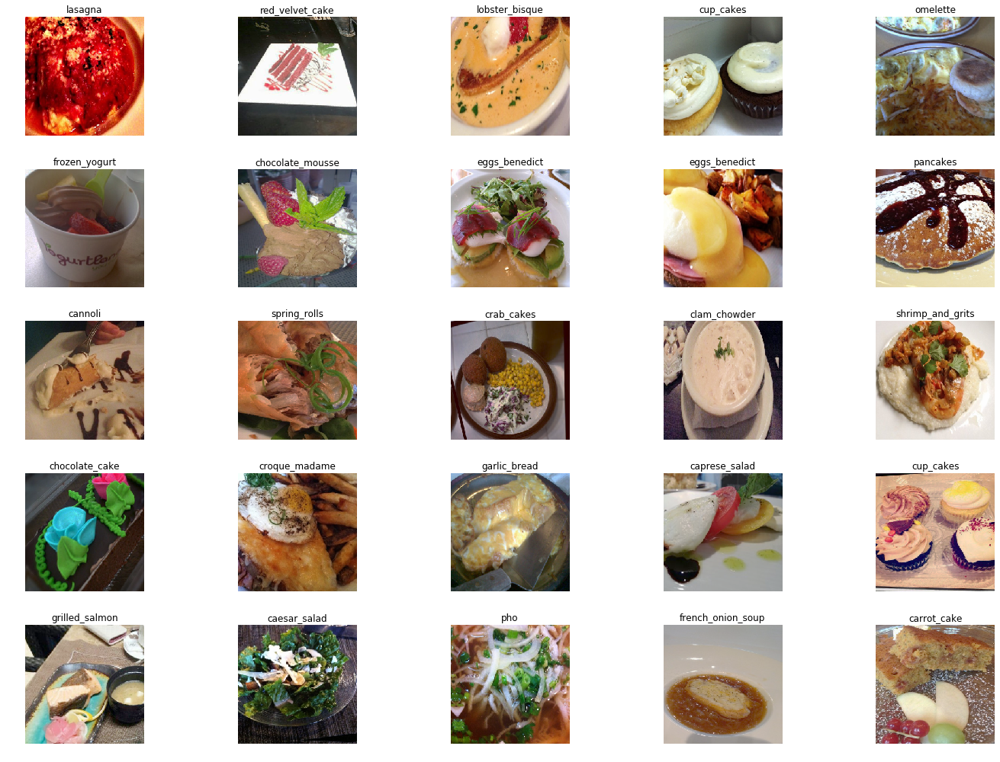

In [13]:
# Visualize some images, with transforms applied randonmly
image_data_bunch.show_batch(rows=5, figsize=(20,14))

In [14]:
# Start of training

In [15]:
# Leverage transfer learning from a ResNet50 pre-trained with ImageNet
# ResNet trains fast and achieves high accuracy
# https://mlperf.org/training-overview/#overview
# https://mlperf.org/inference-overview/#overview

image_learner = cnn_learner(
    image_data_bunch,
    models.resnet50,
    metrics=accuracy,
    wd=1e-1,
)

# Change the output directory to the current working directory
image_learner.model_dir = os.getcwd()
image_learner.path = Path(os.getcwd())

# Display model architecture
# image_learner.model

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /tmp/.cache/torch/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 130MB/s]


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


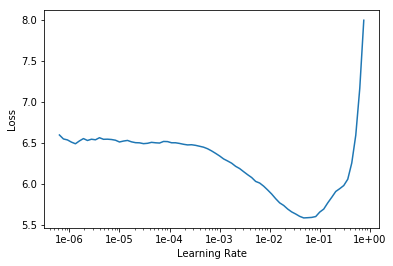

In [16]:
# Finding a good learning rate
# More details here 
# https://sgugger.github.io/how-do-you-find-a-good-learning-rate.html

image_learner.lr_find()
image_learner.recorder.plot()

In [17]:
learning_rate_1 = 1e-2

# Train with 1 cycle policy
# More details here 
# https://sgugger.github.io/the-1cycle-policy.html

image_learner.fit_one_cycle(7, slice(learning_rate_1))
image_learner.save('stage1-resnet50-size256', return_path=True)

epoch,train_loss,valid_loss,accuracy,time
0,1.961371,1.359905,0.630614,21:45
1,1.729640,1.234596,0.665267,20:20
2,1.613701,1.148929,0.694337,20:20
3,1.517084,1.037622,0.715683,20:24
4,1.317852,0.876528,0.756198,20:36
5,1.128380,0.751755,0.797901,20:24
6,1.040669,0.718356,0.803168,20:35


PosixPath('/kaggle/working/stage1-resnet50-size256.pth')

In [18]:
# Now unfreeze the pre-trained part.
image_learner.unfreeze()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


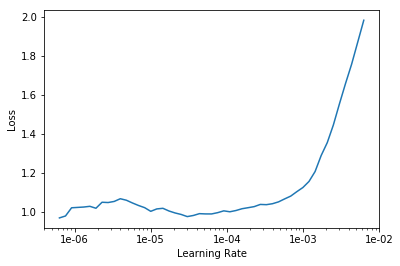

In [19]:
# We need another learning rate for the unfrozen model
image_learner.lr_find()
image_learner.recorder.plot()

In [20]:
# Still using the 1 cyle policy, but with discriminative learning rate
# The pre-trained part should have a smaller learning rate, so that the weights only vary a little
# Meanwhile, the not-pre-trained part should have a higher learning rate, so it will converge faster

image_learner.fit_one_cycle(7, slice(1e-4, learning_rate_1/5))
image_learner.export(os.path.join(os.getcwd(), 'stage2-resnet50-size256-export.pkl'))
image_learner.save("stage2-resnet50-size256", return_path=True)

epoch,train_loss,valid_loss,accuracy,time
0,1.345661,1.000921,0.720198,21:06
1,1.472595,1.078120,0.702020,21:07
2,1.271129,0.845542,0.764713,21:10
3,1.043543,0.729198,0.794535,21:12
4,0.826847,0.577822,0.838614,21:11
5,0.624474,0.495086,0.860198,21:14
6,0.556892,0.476819,0.865624,21:11


PosixPath('/kaggle/working/stage2-resnet50-size256.pth')

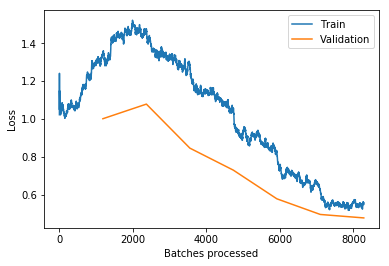

In [21]:
# Plot loss history
# This is typical loss evolution shape, due to the 1 cycle policy.
# Loss increases at first, while the learning rate cycle is in upward phase.
# Then loss decreases in the downward phase of the learning rate cycle, as we are new closer to the optimum range.
image_learner.recorder.plot_losses()

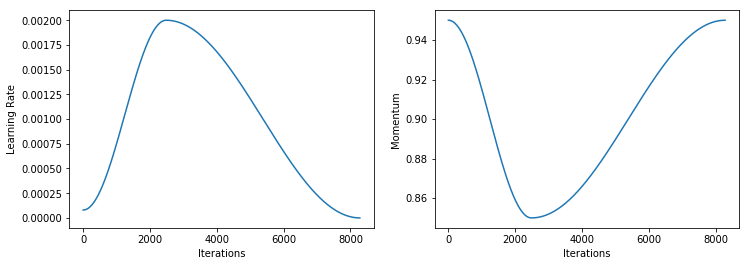

In [22]:
# Plot the cycle of learning rate and momentum
image_learner.recorder.plot_lr(show_moms=True)

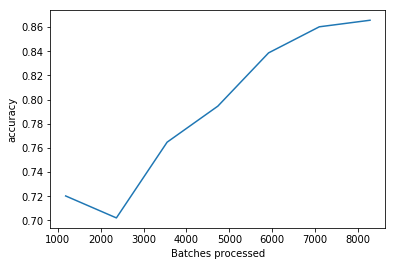

In [23]:
# Plot metrics history 
image_learner.recorder.plot_metrics()

In [24]:
# End of training

In [25]:
# Check the final validation accuracy
image_learner.validate()

[0.476819, tensor(0.8656)]

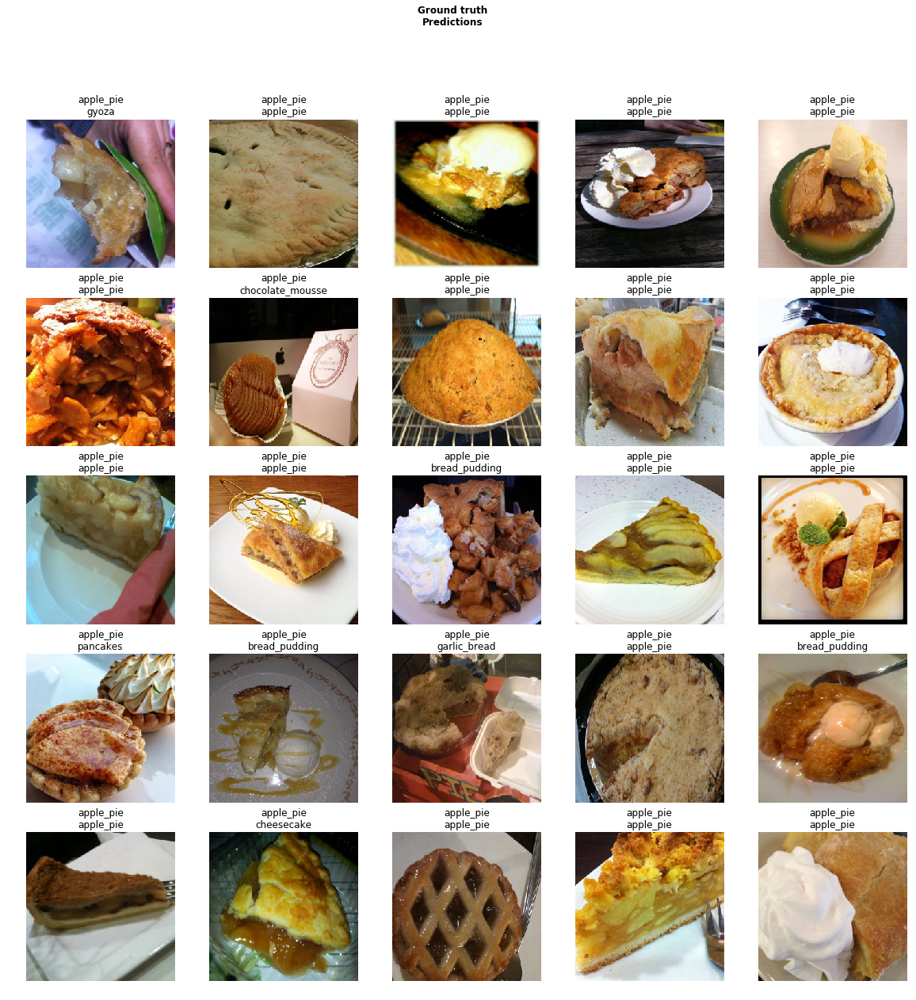

In [26]:
# Visualize a few results
image_learner.show_results()

In [27]:
# Some useful interpretation
interpreter = ClassificationInterpretation.from_learner(image_learner)

In [28]:
# Display the most confused categories, min_val = error threshold for display
interpreter.most_confused(min_val=10)

[('steak', 'filet_mignon', 41),
 ('filet_mignon', 'steak', 34),
 ('chocolate_cake', 'chocolate_mousse', 28),
 ('chocolate_mousse', 'chocolate_cake', 22),
 ('steak', 'pork_chop', 19),
 ('pork_chop', 'steak', 18),
 ('tuna_tartare', 'beef_tartare', 18),
 ('apple_pie', 'bread_pudding', 17),
 ('ice_cream', 'frozen_yogurt', 17),
 ('pork_chop', 'filet_mignon', 17),
 ('pork_chop', 'grilled_salmon', 17),
 ('beef_tartare', 'tuna_tartare', 16),
 ('falafel', 'crab_cakes', 16),
 ('gnocchi', 'ravioli', 16),
 ('prime_rib', 'steak', 16),
 ('chicken_quesadilla', 'breakfast_burrito', 15),
 ('dumplings', 'gyoza', 15),
 ('tiramisu', 'chocolate_mousse', 14),
 ('bread_pudding', 'apple_pie', 13),
 ('ice_cream', 'chocolate_mousse', 13),
 ('ceviche', 'tuna_tartare', 12),
 ('pulled_pork_sandwich', 'hamburger', 12),
 ('ravioli', 'gnocchi', 12),
 ('scallops', 'foie_gras', 12),
 ('breakfast_burrito', 'huevos_rancheros', 11),
 ('grilled_salmon', 'pork_chop', 11),
 ('hamburger', 'pulled_pork_sandwich', 11),
 ('lobst

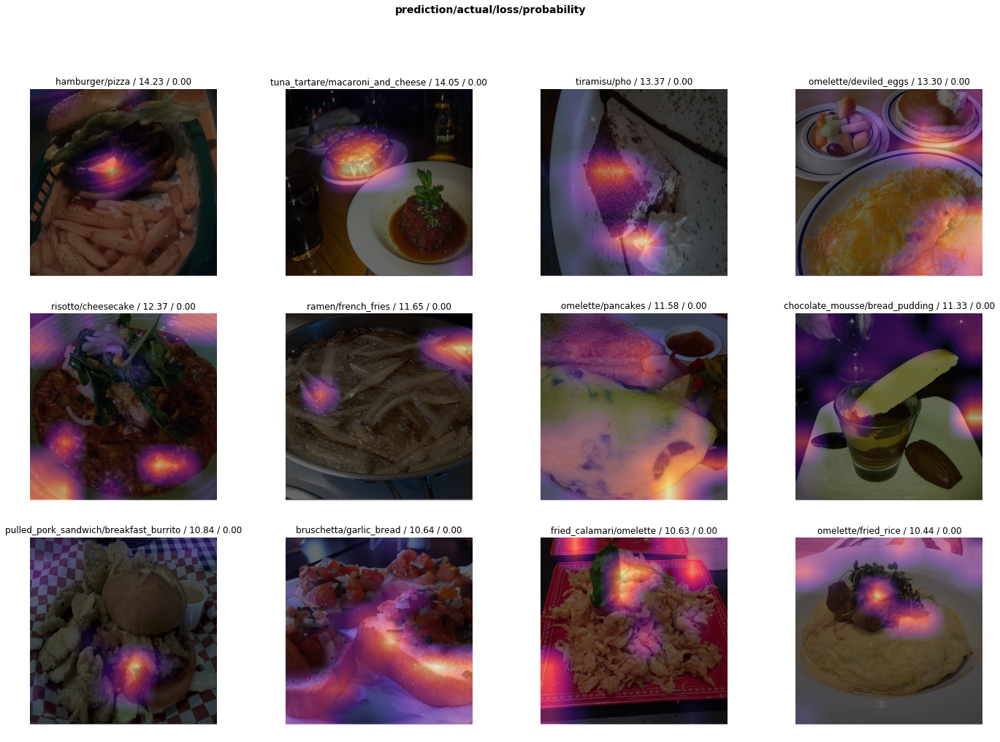

In [29]:
# Display the top losses
interpreter.plot_top_losses(12, figsize=(24,16), heatmap=True)

In [30]:
# Start of inference test

In [31]:
# Create a test directory to hold downloaded image
test_image_dir = Path.cwd().joinpath('test')
test_image_dir.mkdir(parents=True, exist_ok=True)
print(os.listdir(os.getcwd()))

['tmp.pth', 'test', '__notebook__.ipynb', 'stage2-resnet50-size256-export.pkl', '__output__.json', 'stage1-resnet50-size256.pth', 'stage2-resnet50-size256.pth']


In [32]:
# Return the top prediction with descending probabilities
def get_top_predictions(img_learner, img, top_n=5):
    prediction = img_learner.predict(img)
    probabilities = prediction[2]
    partitioned_indexes = np.argpartition(probabilities, -top_n)
    top_probability_indexes = partitioned_indexes[-top_n:]
    
    top_probabilities = probabilities[top_probability_indexes]
    sorted_meta_indexes = np.argsort(top_probabilities)
    sorted_top_indexes = top_probability_indexes[sorted_meta_indexes]
    sorted_top_probabilities = probabilities[sorted_top_indexes].numpy()[::-1]
    
    class_nparray = np.array(img_learner.data.classes)
    sorted_classes = class_nparray[sorted_top_indexes][::-1]
    
    return sorted_classes, sorted_top_probabilities

# Get an image from a url and infer the category
def display_and_predict(img_learner, img_url, test_img_dir):
    urllib.request.urlretrieve(img_url, test_img_dir/'test1.jpg')
    test_image = open_image(test_img_dir/'test1.jpg')
    test_image.show()

    top_clss, top_proba = get_top_predictions(img_learner, test_image, top_n=5)
    return top_clss, top_proba,

test_image_url = 'https://tmbidigitalassetsazure.blob.core.windows.net/secure/RMS/attachments/37/1200x1200/Triple-Chocolate-Mousse-Torte_EXPS_SDAM18_212092_C11_29_2b.jpg'
test_top_classes, test_top_probabilities = display_and_predict(image_learner, test_image_url, test_image_dir)

for label, probability in zip(test_top_classes, test_top_probabilities):
    print("{:f} {:s}".format(probability, label))

NameError: name 'urllib' is not defined